**Mounting Google Drive:**

In [1]:
#for setting up on colab
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [2]:
from os import path
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
accelerator = 'cu80' if path.exists('/opt/bin/nvidia-smi') else 'cpu'
!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.0-{platform}-linux_x86_64.whl torchvision
import torch

tcmalloc: large alloc 1073750016 bytes == 0x5b5ae000 @  0x7f39485152a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641


**Importing libraries:**

In [0]:

# Importing the libraries
from __future__ import print_function

import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import time
import pickle


**Data:**

/usr/local/lib/python3.6/dist-packages/torchvision/transforms/transforms.py:188: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  "please use transforms.Resize instead.")


Files already downloaded and verified


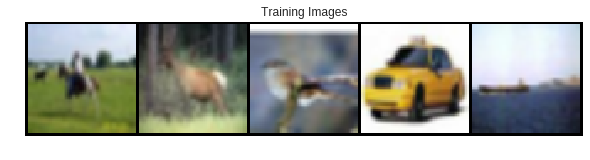

In [29]:
batchSize = 64 
imageSize = 64

transform = transforms.Compose([transforms.Scale(imageSize), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),]) # We create a list of transformations (scaling, tensor conversion, normalization) to apply to the input images.

dataset = dset.CIFAR10(root = './data', download = True, transform = transform) # We download the training set in the ./data folder and we apply the previous transformations on each image.
dataloader = torch.utils.data.DataLoader(dataset, batch_size = batchSize, shuffle = True, num_workers = 2) # We use dataLoader to get the images of the training set batch by batch.

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:5], padding=2, normalize=True).cpu(),(1,2,0)))

**Weight Initialization:**

In [0]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)



**Generator and Discriminator: **

![link text](https://cdn-images-1.medium.com/max/1600/0*CpA-BuAtKl6SrrZ8.png)

In [0]:
class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(100, 512, 4, 1, 0, bias = False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias = False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias = False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias = False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias = False),
            nn.Tanh()
        )

    def forward(self, input):
        output = self.main(input)
        return output

netG = Generator()
netG.apply(weights_init)
netG=netG.cuda()

class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(64, 128, 4, 2, 1, bias = False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(128, 256, 4, 2, 1, bias = False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(256, 512, 4, 2, 1, bias = False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Conv2d(512, 1, 4, 1, 0, bias = False),
            nn.Sigmoid()
        )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1)

netD = Discriminator()
netD.apply(weights_init)
netD=netD.cuda()



**Optimizer:**

In [0]:
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr = 0.0002, betas = (0.5, 0.999))

fixed_noise = torch.randn(64, 100, 1, 1).cuda()


**Training:**

In [15]:

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
# Number of training epochs
num_epochs = 10

ROOT='/content/drive/My Drive/App/'

print("Starting Training Loop...")

for epoch in range(num_epochs):
    start_time = time.time()
    print('Start Time:',time.strftime("%H:%M:%S", time.gmtime(start_time)))
    for i, data in enumerate(dataloader, 0):
        
        netD.zero_grad()
        
        real, _ = data
        input = Variable(real).cuda()
        target = Variable(torch.ones(input.size()[0])).cuda()
        output = netD(input)
        errD_real = criterion(output, target.cuda())
        
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1)).cuda()
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target.cuda())
        
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()

        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0])).cuda()
        output = netD(fake).cuda()
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        print('[%d/%d][%d/%d] Loss_Discriminator: %.4f Loss_Generator: %.4f' % (epoch, num_epochs, i, len(dataloader), errD.data, errG.data))
          # Save Losses for plotting later
        G_losses.append(errG.data)
        D_losses.append(errD.data)
    
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        
    #to keep track how long the program has been running 
    elapsed_time = time.time()
    print('Elapsed Time',time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))  
    
    #to save model
    if epoch%4==0:
      with open(ROOT + 'model_e{}_epoch10_k{}'.format(epoch, time.time()),
                'wb+') as fp:
              pickle.dump(netG, fp)
      with open(ROOT + 'model_e{}_epoch11_k{}'.format(epoch, time.time()),
                'wb+') as fp:
              pickle.dump(netD, fp)        

Starting Training Loop...
Start Time: 03:39:34
[0/10][0/782] Loss_Discriminator: 1.5728 Loss_Generator: 5.6627
[0/10][1/782] Loss_Discriminator: 0.9549 Loss_Generator: 6.3569
[0/10][2/782] Loss_Discriminator: 0.7501 Loss_Generator: 6.6829
[0/10][3/782] Loss_Discriminator: 0.6829 Loss_Generator: 6.0762
[0/10][4/782] Loss_Discriminator: 0.9732 Loss_Generator: 6.8646
[0/10][5/782] Loss_Discriminator: 0.8536 Loss_Generator: 7.4281
[0/10][6/782] Loss_Discriminator: 0.6029 Loss_Generator: 8.1875
[0/10][7/782] Loss_Discriminator: 0.5844 Loss_Generator: 6.5625
[0/10][8/782] Loss_Discriminator: 0.8076 Loss_Generator: 9.7373
[0/10][9/782] Loss_Discriminator: 0.3037 Loss_Generator: 8.0878
[0/10][10/782] Loss_Discriminator: 0.6599 Loss_Generator: 9.6862
[0/10][11/782] Loss_Discriminator: 0.4334 Loss_Generator: 9.9494
[0/10][12/782] Loss_Discriminator: 0.4241 Loss_Generator: 9.6090
[0/10][13/782] Loss_Discriminator: 0.5531 Loss_Generator: 12.9755
[0/10][14/782] Loss_Discriminator: 0.4814 Loss_Gener

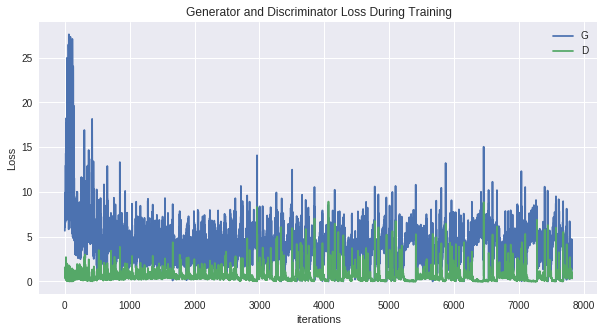

In [19]:
#Visualization adopted from the provided references

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

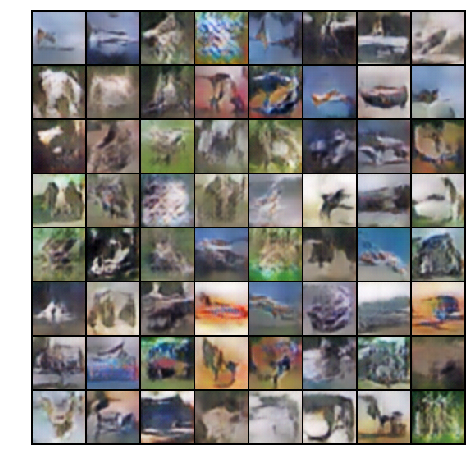

In [20]:
#Visualization adopted from the provided references

#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

torch.Size([3, 143, 557])
3


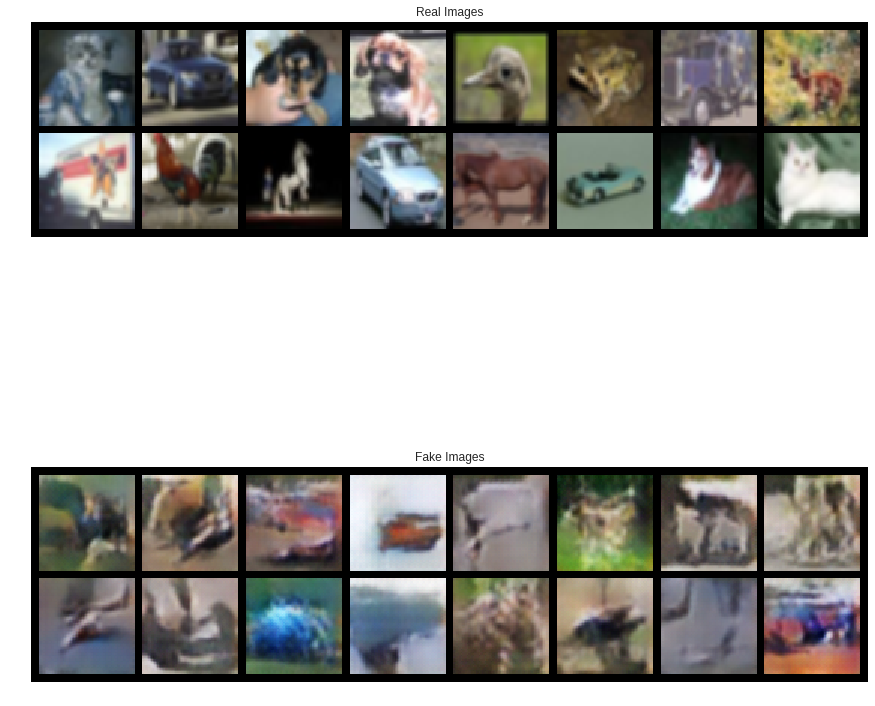

In [96]:

inputs=[]
output=[]
plt.figure(figsize=(15,15))
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.subplot(2,1,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:16], padding=5, normalize=True).cpu(),(1,2,0)))

for i in range(3):
  inputs.append(Variable(torch.randn(input.size()[0], 100, 1, 1)).cuda())
for vec in inputs:
  img=netG(vec).detach().cpu()
  output.append(vutils.make_grid(img, padding=5, normalize=True))


plt.subplot(2,1,2)

plt.axis("off")
plt.title("Fake Images")
print(output[0].size())
print(len(output))
plt.imshow(np.transpose(output[0],(1,2,0)))
#
plt.show()

In [0]:
stats={'D_losses':D_losses,'G_losses':G_losses,'img_list':img_list}
with open(ROOT + 'stats',
                'wb+') as fp:
              pickle.dump(stats, fp)       

Note: Chrome kept crashing or colab kep disconnecting due to which several checkpoints were created. A model trained for 25 epochs has been saved. The model file is over 30mb. The model can be shown if asked.

**References:**

https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html?fbclid=IwAR2rJtQGvLakoeKbqda7o1MGUSOfq4KcdTR75tywaDAtcFf9T5inE-S1vFE

Note: The architecture used has been referred from the above source. The hyper parameters have been selected after referring to various sources.

Some other sources used are given below:

https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f


